## Importing the needed Libraries

In [ ]:
import io
from PIL import Image

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn

from huggingface_hub import notebook_login

from datasets import load_dataset, concatenate_datasets, DatasetDict

from transformers import AutoImageProcessor, ViTForImageClassification

from transformers import Trainer, TrainingArguments


import transformers
print(transformers.__version__)

import evaluate

4.52.4


### Log into huggingface
May use huggingface-cli login as a command to do so (works better on Mac)

In [ ]:

notebook_login()

## Loading Dataset and display splits

In [ ]:
dataset = load_dataset('bentrevett/caltech-ucsd-birds-200-2011')
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'label', 'bbox'],
        num_rows: 5994
    })
    test: Dataset({
        features: ['image', 'label', 'bbox'],
        num_rows: 5794
    })
})

#### The dataset contains the following features:

- image: A PIL image object (RGB mode, size 500x301 pixels)
- label: An integer class label that represents the Birds name
- bbox: A bounding box defining the region the bird is in (used for object detection)

In [ ]:
dataset['train'][0]

{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x301>,
 'label': 0,
 'bbox': [152.0, 86.0, 272.0, 227.0]}

### Print of all the labels

In [ ]:
labels = dataset['train'].unique('label')
print(len(labels),labels)

200 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199]


## A display of the Images randomly selected

The Id is changed to the actual Birds name for readability

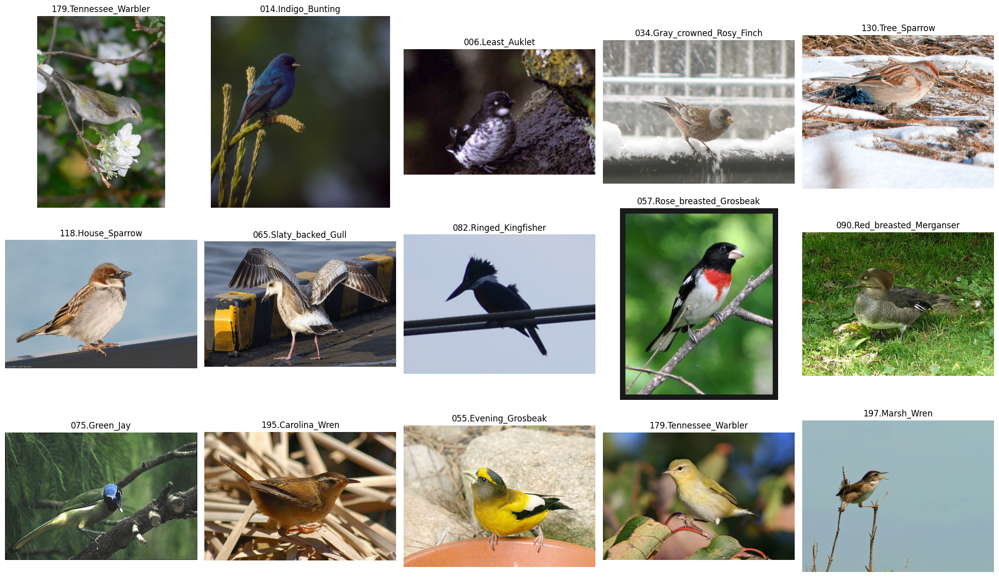

In [ ]:
def show_samples(ds, rows, cols):
    samples = ds.shuffle().select(np.arange(rows*cols))
    fig = plt.figure(figsize=(cols*4, rows*4))

    class_names = ds.features['label'].names

    for i, sample in enumerate(samples):
        img = sample['image']
        label_id = sample['label']
        label_name = class_names[label_id]

        ax = fig.add_subplot(rows, cols, i+1)
        ax.imshow(img)
        ax.set_title(label_name)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

show_samples(dataset['train'], rows=3, cols=5)

## Preparing the dataset

First we concatenate the Dataset to split it in a different way

In [ ]:
# Combine Datasets for different split
dataset = concatenate_datasets([dataset['test'], dataset['train']]);
dataset 

Dataset({
    features: ['image', 'label', 'bbox'],
    num_rows: 11788
})

### Split the data in a different way as before

To have more Data for Training all the data is now split in a 80/10/10. So first we split 80% for training and 20% for evaluation and then we split the amount for eval 50/50 test/validation. 

In [ ]:
split_dataset = dataset.train_test_split(test_size=0.2) # 80% train, 20% evaluation
eval_dataset = split_dataset['test'].train_test_split(test_size=0.5) # 50% validation, 50% test

# recombining the splits using a DatasetDict

dataset = DatasetDict({
    'train': split_dataset['train'],
    'validation': eval_dataset['train'],
    'test': eval_dataset['test']
})

dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'label', 'bbox'],
        num_rows: 9430
    })
    validation: Dataset({
        features: ['image', 'label', 'bbox'],
        num_rows: 1179
    })
    test: Dataset({
        features: ['image', 'label', 'bbox'],
        num_rows: 1179
    })
})

### Mapping of the label

We now map the label to a new ID. This is not a must in this dataset but I still wanted to do it to mix things up. The outcome is the same so I did it. The reason it is unnecessary, is that the labels are already numbers. 

In [ ]:
label2id = {c:idx for idx,c in enumerate(labels)}
id2label = {idx:c for idx,c in enumerate(labels)}

### Load Pretrained Image Processor
Initializes an image processor tailored to the Vision Transformer (ViT) model. This ensures that all image inputs are preprocessed (e.g. normalized, resized) in the exact way the model expects. After we print the config.

In [ ]:
processor = AutoImageProcessor.from_pretrained('google/vit-base-patch16-224')
processor

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


ViTImageProcessor {
  "do_convert_rgb": null,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTImageProcessor",
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 224,
    "width": 224
  }
}

### Define Data Augmentation and Transformation
Applies a series of image augmentations (e.g. crop, flip, color jitter) to improve model generalization during training. The `img_transform` function converts images to tensors and maps each label using `label2id`, preparing the batch for model input.

In [ ]:
from torchvision import transforms as the_transformer

image_augmentations = the_transformer.Compose([
    the_transformer.RandomResizedCrop(224),
    the_transformer.RandomHorizontalFlip(),
    the_transformer.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
])

def img_transform(batch):
    images = [image_augmentations(x.convert('RGB')) for x in batch['image']]

    inputs = processor(images, return_tensors='pt')

    inputs['labels'] = torch.tensor([label2id[y] for y in batch['label']])
    return inputs


### Apply Transform to Dataset
Attaches the `img_transform` function to the dataset so each batch is dynamically transformed and formatted during loading, ensuring consistency and augmentation on-the-fly.

In [ ]:
processed_dataset = dataset.with_transform(img_transform)

Lets print the dataset again

In [ ]:
processed_dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'label', 'bbox'],
        num_rows: 9430
    })
    validation: Dataset({
        features: ['image', 'label', 'bbox'],
        num_rows: 1179
    })
    test: Dataset({
        features: ['image', 'label', 'bbox'],
        num_rows: 1179
    })
})

## Device Selection & Custom Collate Function
Selects the best available device: Apple's Metal Performance Shaders (mps) if available, otherwise falls back to CPU.

The `collate_fn` ensures that each batch from the DataLoader is stacked into tensors and moved to the correct device for training or inference.

In [ ]:
# Try to send to GPU
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")

print(torch.backends.mps.is_available())
print(torch.backends.mps.is_built())

def collate_fn(batch):
    return {
        'pixel_values': torch.stack([x['pixel_values'] for x in batch]).to(device),
        'labels': torch.tensor([x['labels'] for x in batch]).to(device)
    }

True
True


### Metric Loading & Accuracy Function
Loads the accuracy metric using the evaluate library (from HuggingFace ecosystem).

Defines a compute_metrics function that calculates accuracy by extracting predicted classes from logits and comparing them to true labels — useful for model evaluation and tracking performance.

In [ ]:
accuracy = evaluate.load('accuracy')
def compute_metrics(eval_preds):
    logits, labels = eval_preds
    predictions = np.argmax(logits,axis=1)
    score = accuracy.compute(predictions=predictions, references=labels)
    return score

## Loading our Model

We'll use `ViTForImageClassification` as our base model, initialized with pretrained weights from google/vit-base-patch16-224.

Since our dataset has a different number of classes than the original model, we must update the classification head by specifying the num_labels parameter. To ensure correct label interpretation, we also pass the id2label and label2id mappings because we decided to use them.

Additionally, we set ignore_mismatched_sizes=True to allow the model to load even though the size of the classification layer no longer matches the original weights — this replaces the head with a new, randomly initialized one.

In [ ]:
model = ViTForImageClassification.from_pretrained(
    'google/vit-base-patch16-224',
    num_labels = len(labels),
    id2label = id2label,
    label2id = label2id,
    ignore_mismatched_sizes = True
)

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([200]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([200, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


#### This is the architecture of our model

In [ ]:
model

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=768, out_features=3072, bias=True)
            (intermed

### Freezing the Base Model (Except the Classifier)
Since we are only interested in fine-tuning the final classification layer, we "freeze" all other layers in the model to prevent them from being updated during training. This is done by setting `requires_grad = False` for every parameter except those in the classifier layer.

In [ ]:
for name,p in model.named_parameters():
    if not name.startswith('classifier'):
        p.requires_grad = False

### Verifying Parameter Counts

We now verify how many params are trainable. In our case 153'000.

In [ ]:
num_params = sum([p.numel() for p in model.parameters()])
trainable_params = sum([p.numel() for p in model.parameters() if p.requires_grad])

print(f"{num_params = :,} | {trainable_params = :,}")

num_params = 85,952,456 | trainable_params = 153,800


## Starting with the training

### Define Training Arguments
We configure the training process using TrainingArguments, specifying everything from batch size and learning rate to evaluation and logging strategies. This setup ensures our model is trained efficiently, evaluated regularly, and pushed to the Hugging Face Hub.

We used 15 Epochs to hopefully get better results then with 5 and reduced the learning_rate to get a preciser result hopefully not ending in too much time for Training.

In [ ]:
training_args = TrainingArguments(
    output_dir="./vit-base-caltech-ucsd-birds-200-2011",
    per_device_train_batch_size=16,
    eval_strategy="epoch",
    save_strategy="epoch",
    logging_steps=100,
    num_train_epochs=15,
    learning_rate=5e-5,
    weight_decay=0.01,
    warmup_ratio=0.1,
    save_total_limit=2,
    remove_unused_columns=False,
    push_to_hub=True,
    report_to='tensorboard',
    load_best_model_at_end=True,
    metric_for_best_model='accuracy',
    greater_is_better=True,
    run_name="vit-base-cub200-lr5e-5-augmented"
)

###  Initialize the Trainer

Now we set up the Trainer from Hugging Face's transformer lib. We use the args defined above.

In [ ]:
trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
    train_dataset=processed_dataset["train"],
    eval_dataset=processed_dataset["validation"],
    tokenizer=processor
)

/var/folders/7m/n3nzwb7d5kv8n2_m01gqwpt40000gq/T/ipykernel_74952/613752247.py:1: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


### Starting training
We start the training here with everything above. On GPU it took 31:30 Min. The Results got worse after epoch 11.


#### What do the results tell us?
We start with massive improvements, which could be the result of a high learning rate. To fix this I'd use a learning rate scheduler to decrease it over time.
Around Epoch 11 we have a plateau, showing early signs of overfitting, because training loss drops but accuracy doesn't improve. 

In [ ]:
trainer.train()

/Users/university/ZHAW/aiapplications/abschlussprojekt/env/lib/python3.11/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Epoch,Training Loss,Validation Loss,Accuracy
1,5.004100,4.740787,0.097540
2,3.574500,3.265115,0.516539
3,2.349600,2.266578,0.632740
4,1.802400,1.797362,0.671756
5,1.461300,1.476470,0.726887
6,1.241400,1.371884,0.711620
7,1.222000,1.280409,0.726039
8,1.067800,1.249617,0.724343
9,1.081000,1.141784,0.751484
10,0.985900,1.043912,0.774385


/Users/university/ZHAW/aiapplications/abschlussprojekt/env/lib/python3.11/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/Users/university/ZHAW/aiapplications/abschlussprojekt/env/lib/python3.11/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/Users/university/ZHAW/aiapplications/abschlussprojekt/env/lib/python3.11/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/Users/university/ZHAW/aiapplications/abschlussprojekt/env/lib/python3.11/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not suppo

TrainOutput(global_step=8850, training_loss=1.7306056299586754, metrics={'train_runtime': 1975.1902, 'train_samples_per_second': 71.613, 'train_steps_per_second': 4.481, 'total_flos': 1.0980693875567002e+19, 'train_loss': 1.7306056299586754, 'epoch': 15.0})

### Now we evaluate it with our test dataset

In [ ]:
trainer.evaluate(processed_dataset['test'])

/Users/university/ZHAW/aiapplications/abschlussprojekt/env/lib/python3.11/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


{'eval_loss': 1.159796953201294,
 'eval_accuracy': 0.7370653095843935,
 'eval_runtime': 15.5505,
 'eval_samples_per_second': 75.818,
 'eval_steps_per_second': 9.517,
 'epoch': 15.0}

### Next we get random images from our test dataset and check how well we're doing by looking at some predictions

/Users/university/ZHAW/aiapplications/abschlussprojekt/env/lib/python3.11/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


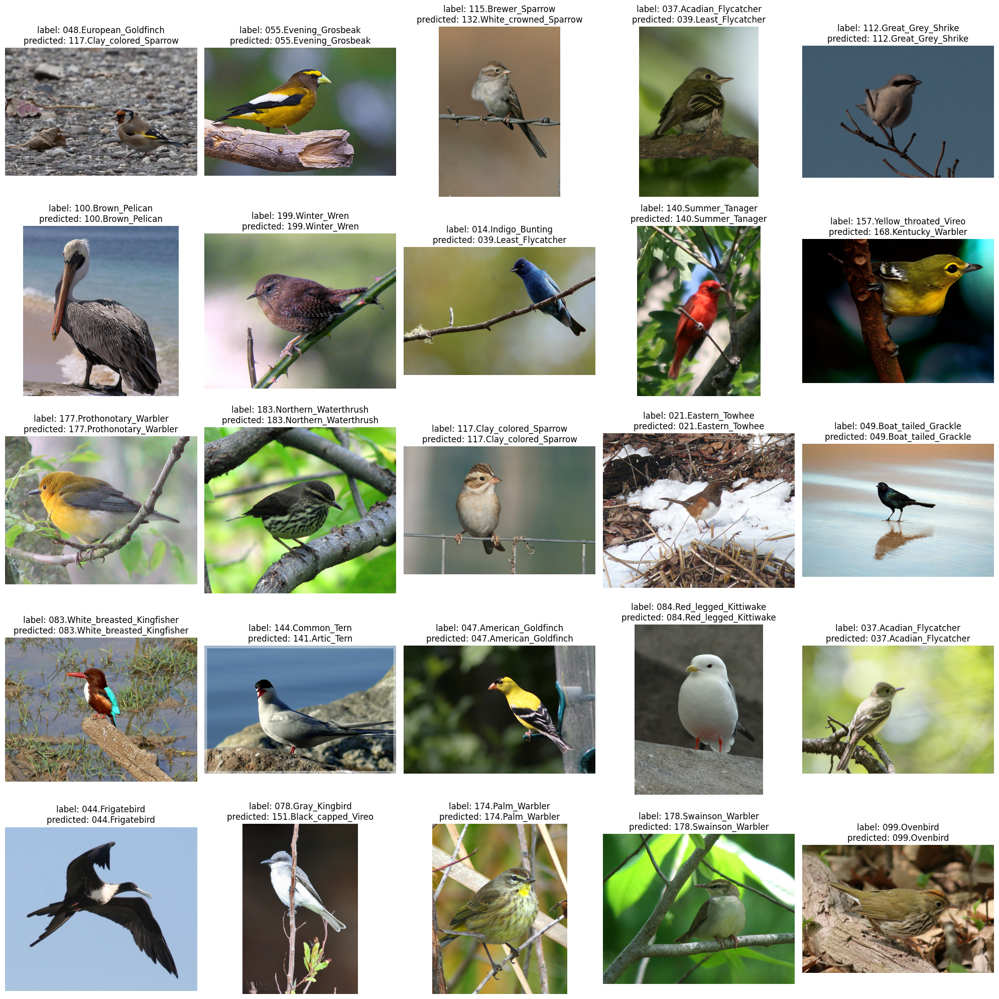

In [ ]:
def show_predictions(rows, cols):
    samples = dataset['test'].shuffle().select(np.arange(rows * cols))
    processed_samples = samples.with_transform(img_transform)
    predictions = trainer.predict(processed_samples).predictions.argmax(axis=1)

    class_names = dataset['test'].features['label'].names

    fig = plt.figure(figsize=(cols * 4, rows * 4))
    for i in range(rows * cols):
        img = samples[i]['image']
        true_label_id = samples[i]['label']
        predicted_label_id = predictions[i]

        true_label = class_names[true_label_id]
        predicted_label = class_names[predicted_label_id]

        label = f"label: {true_label}\npredicted: {predicted_label}"

        ax = fig.add_subplot(rows, cols, i + 1)
        ax.imshow(img)
        ax.set_title(label)
        ax.axis('off')

    plt.tight_layout()
    plt.show()


show_predictions(rows=5,cols=5)

### As a final step, we make the configurations and upload it to Hugging Face.

In [ ]:
kwargs = {
    "finetuned_from": model.config._name_or_path,
    "dataset": 'bentrevett/caltech-ucsd-birds-200-2011',
    "tasks": "image-classification",
    "tags": ['image-classification'],
}

In [ ]:
trainer.save_model()
trainer.push_to_hub('🦆🦅', **kwargs)

events.out.tfevents.1748645906.marcs-macbook-pro.home.74952.0:   0%|          | 0.00/34.7k [00:00<?, ?B/s]

Upload 2 LFS files:   0%|          | 0/2 [00:00<?, ?it/s]

events.out.tfevents.1748647941.marcs-macbook-pro.home.74952.1:   0%|          | 0.00/411 [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/Flogoro/vit-base-caltech-ucsd-birds-200-2011/commit/336cbfa593490f76298e7a75ea363c141cf1304a', commit_message='🦆🦅', commit_description='', oid='336cbfa593490f76298e7a75ea363c141cf1304a', pr_url=None, repo_url=RepoUrl('https://huggingface.co/Flogoro/vit-base-caltech-ucsd-birds-200-2011', endpoint='https://huggingface.co', repo_type='model', repo_id='Flogoro/vit-base-caltech-ucsd-birds-200-2011'), pr_revision=None, pr_num=None)